In [2]:
import pandas as pd
import geopandas as gpd
from shapely import wkt
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline
import matplotlib.image as mpimg
import seaborn as sns
import math
from tensorflow import keras
import tensorflow as tf
from tensorflow.keras import Model, Input
from tensorflow.keras.layers import Dense, Flatten
from torch.utils.data import Dataset, DataLoader
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import torch
import torch.nn as nn
from torch.nn import init
import torch.optim as optim
import torch.nn.functional as F
import functools
from torch.autograd import Variable
import warnings
from sklearn.model_selection import train_test_split
warnings.filterwarnings("ignore")

2024-07-23 23:51:30.273855: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [3]:
df = pd.read_csv('/Users/adityajain/Downloads/pend-gdis-1960-2018-disasterlocations-gdb/out_csv.csv')

In [4]:
df_cent = pd.read_csv('/Users/adityajain/Downloads/pend-gdis-1960-2018-disasterlocations-csv/pend-gdis-1960-2018-disasterlocations.csv')

In [5]:
print(df.dtypes)

Unnamed: 0        int64
id               object
country          object
iso3             object
gwno            float64
geo_id          float64
geolocation      object
level             int64
adm1             object
adm2             object
adm3             object
location         object
historical      float64
hist_country     object
disastertype     object
disasterno       object
Shape_Length    float64
Shape_Area      float64
geometry         object
dtype: object


In [6]:
print(df.head)

<bound method NDFrame.head of        Unnamed: 0     id   country iso3   gwno   geo_id    geolocation  level  \
0               0    109   Albania  ALB  339.0    346.0    Ana E Malit      3   
1               1    109   Albania  ALB  339.0    351.0         Bushat      3   
2               2    175    Angola  AGO  540.0    760.0         Onjiva      3   
3               3    187    Angola  AGO  540.0    710.0          Evale      3   
4               4    187    Angola  AGO  540.0    749.0           Mupa      3   
...           ...    ...       ...  ...    ...      ...            ...    ...   
39948       39948  06-94  Dominica  NaN    NaN  45253.0  Saint Patrick      1   
39949       39949  06-94  Dominica  NaN    NaN  45254.0   Saint Andrew      1   
39950       39950  06-94  Dominica  NaN    NaN  45255.0   Saint George      1   
39951       39951  06-94  Dominica  NaN    NaN  45256.0    Saint David      1   
39952       39952  06-94  Dominica  NaN    NaN  45257.0     Saint Paul      1  

In [7]:
df_cent = df_cent.drop(['id','country','iso3','geolocation','level','adm1','adm2','adm3','location','historical','hist_country','disastertype','disasterno'],axis=1)

In [8]:
column_to_drop = ['Unnamed: 0','hist_country','id','gwno','disasterno','adm1','adm2','adm3','location']
new_df = df.drop(column_to_drop, axis=1)
new_df

,country,iso3,geo_id,geolocation,level,historical,disastertype,Shape_Length,Shape_Area,geometry
0,Albania,ALB,346.0,Ana E Malit,3,0.0,flood,0.304591,0.004769,MULTIPOLYGON (((19.384269714000027 41.99633407...
1,Albania,ALB,351.0,Bushat,3,0.0,flood,0.495982,0.006454,MULTIPOLYGON (((19.559324265000043 41.93292236...
2,Angola,AGO,760.0,Onjiva,3,0.0,flood,1.725210,0.179495,MULTIPOLYGON (((15.361865997000052 -17.2997074...
3,Angola,AGO,710.0,Evale,3,0.0,flood,1.719060,0.172620,MULTIPOLYGON (((16.11335372900004 -16.40042877...
4,Angola,AGO,749.0,Mupa,3,0.0,flood,2.028440,0.183125,MULTIPOLYGON (((16.11335372900004 -16.40042877...
...,...,...,...,...,...,...,...,...,...,...
39948,Dominica,NaN,45253.0,Saint Patrick,1,1.0,storm,0.504306,0.007373,MULTIPOLYGON (((-61.31208419799998 15.23930454...
39949,Dominica,NaN,45254.0,Saint Andrew,1,1.0,storm,0.799909,0.015397,MULTIPOLYGON (((-61.40016937299998 15.50179290...
39950,Dominica,NaN,45255.0,Saint George,1,1.0,storm,0.327972,0.004680,MULTIPOLYGON (((-61.301326751999966 15.3246822...
39951,Dominica,NaN,45256.0,Saint David,1,1.0,storm,0.691109,0.010508,MULTIPOLYGON (((-61.25374984699994 15.43152713...


In [9]:
frames = [new_df, df_cent]
result = pd.concat(frames, axis=1)
print(result)

        country iso3   geo_id    geolocation  level  historical disastertype  \
0       Albania  ALB    346.0    Ana E Malit      3         0.0        flood   
1       Albania  ALB    351.0         Bushat      3         0.0        flood   
2        Angola  AGO    760.0         Onjiva      3         0.0        flood   
3        Angola  AGO    710.0          Evale      3         0.0        flood   
4        Angola  AGO    749.0           Mupa      3         0.0        flood   
...         ...  ...      ...            ...    ...         ...          ...   
39948  Dominica  NaN  45253.0  Saint Patrick      1         1.0        storm   
39949  Dominica  NaN  45254.0   Saint Andrew      1         1.0        storm   
39950  Dominica  NaN  45255.0   Saint George      1         1.0        storm   
39951  Dominica  NaN  45256.0    Saint David      1         1.0        storm   
39952  Dominica  NaN  45257.0     Saint Paul      1         1.0        storm   

       Shape_Length  Shape_Area  \
0   

In [10]:
temp = df_cent[result['disastertype'] == 'flood']
sal = pd.DataFrame(temp['year'])
pd.set_option('display.float_format', lambda x: '%.2f' % x)
sal.describe()

,year
count,17347.00
mean,2005.06
std,9.98
min,1960.00
25%,2000.00
50%,2007.00
75%,2012.00
max,2018.00


In [11]:
missing_values = result.isnull().sum()
print(missing_values)

country           0
iso3            315
geo_id            0
geolocation       0
level             0
historical        0
disastertype      0
Shape_Length      0
Shape_Area        0
geometry          0
gwno            434
year              0
geo_id            0
latitude          0
longitude         0
dtype: int64


In [12]:
result = result.dropna()

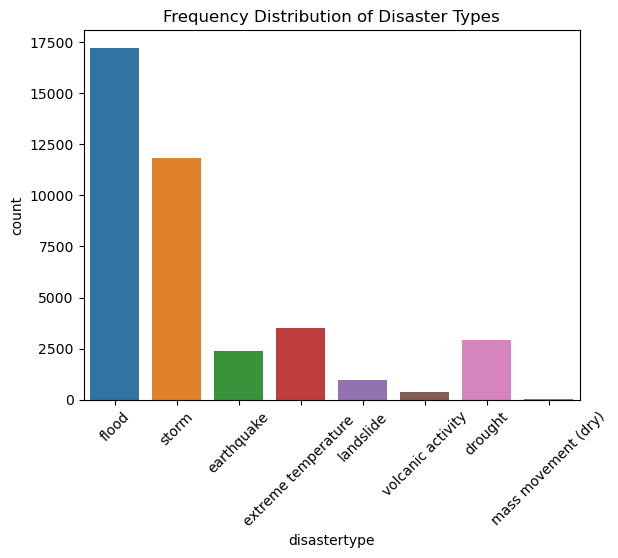

In [13]:
sns.countplot(data=result, x='disastertype')
plt.title('Frequency Distribution of Disaster Types')
plt.xticks(rotation=45)
plt.show()

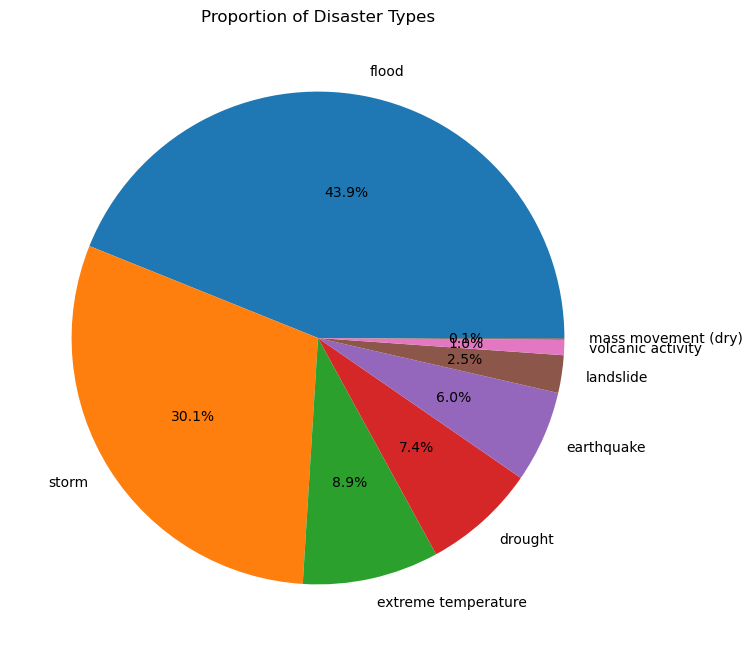

In [14]:
result['disastertype'].value_counts().plot.pie(autopct='%1.1f%%', figsize=(8, 8))
plt.title('Proportion of Disaster Types')
plt.ylabel('')
plt.show()

In [15]:
unique_locations = result['geolocation'].nunique()
print(f'Number of unique geolocations: {unique_locations}')


Number of unique geolocations: 9660


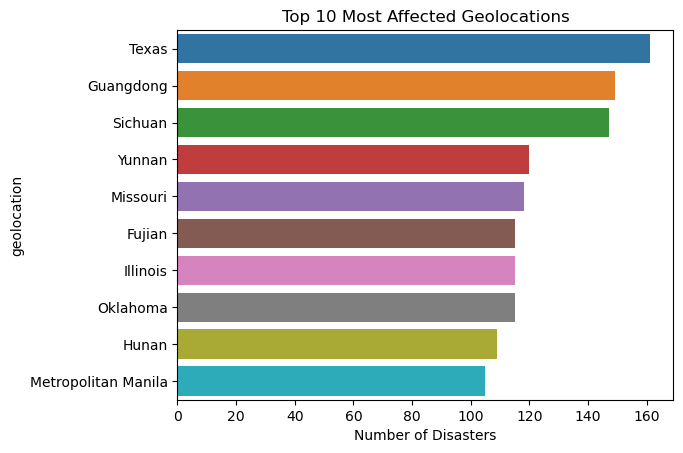

In [16]:
top_locations = result['geolocation'].value_counts().head(10)
sns.barplot(x=top_locations.values, y=top_locations.index)
plt.title('Top 10 Most Affected Geolocations')
plt.xlabel('Number of Disasters')
plt.show()

/var/folders/29/t048k5q123x88dp_v623bs5c0000gn/T/ipykernel_87265/3872451344.py:8: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


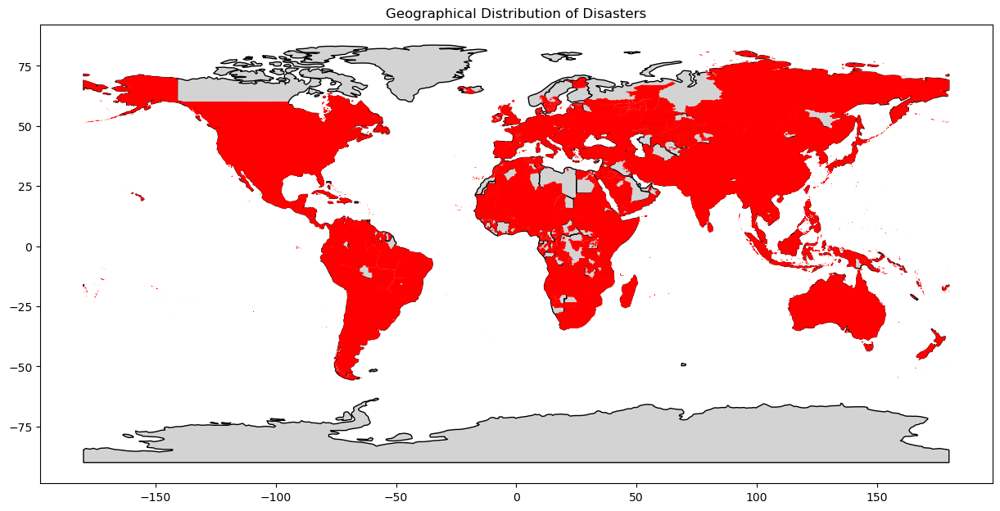

In [ ]:
result['geometry'] = result['geometry'].apply(wkt.loads)

gdf = gpd.GeoDataFrame(result, geometry='geometry')

world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

ax = world.plot(figsize=(15, 10), color='lightgrey', edgecolor='black')

gdf.plot(ax=ax, marker='o', color='red', markersize=5)

plt.title('Geographical Distribution of Disasters')
plt.show()

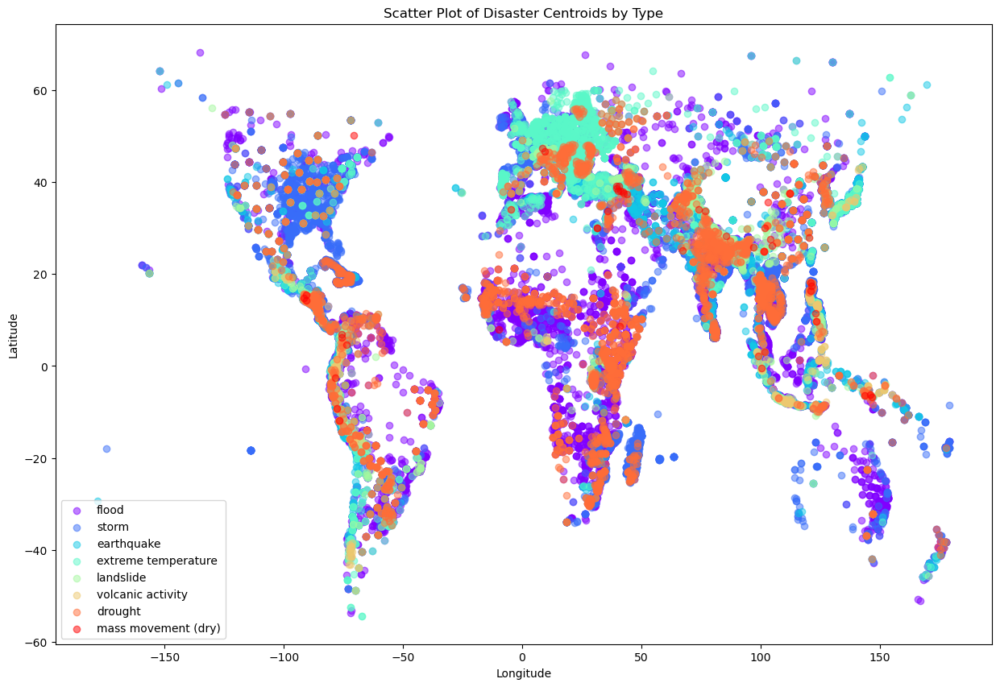

In [17]:
# plt.scatter(result['longitude'], result['latitude'], alpha=0.5)
# plt.title('Scatter Plot of Disaster Centroids')
# plt.xlabel('Longitude')
# plt.ylabel('Latitude')
# plt.show()

fig, ax = plt.subplots(figsize=(15, 10))

disaster_types = result['disastertype'].unique()
colors = plt.cm.rainbow(np.linspace(0, 1, len(disaster_types)))

for disaster_type, color in zip(disaster_types, colors):
    subset = result[result['disastertype'] == disaster_type]
    ax.scatter(subset['longitude'], subset['latitude'], alpha=0.5, label=disaster_type, color=color)

plt.title('Scatter Plot of Disaster Centroids by Type')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend()
plt.show()

Floods and Storms:
Floods (purple) and storms (blue) are prevalent in coastal and low-lying regions.
High concentration in Southeast Asia, particularly in countries like India, Bangladesh, and the Philippines.
Significant occurrences in the eastern United States and Central America.

Earthquakes:
Earthquakes (red) are concentrated along tectonic plate boundaries.
High density in the Pacific Ring of Fire, affecting countries like Japan, Indonesia, and the west coast of the Americas.
Significant occurrences in southern Europe and parts of the Middle East.

Extreme Temperatures:
Extreme temperature events (green) are scattered but more frequent in inland and northern regions.
Noticeable in parts of North America, Europe, and central Asia.

Landslides:
Landslides (brown) are more common in mountainous regions.
High frequency in the Himalayan region, Andes, and certain parts of Southeast Asia.

Volcanic Activity:
Volcanic activities (cyan) are concentrated in the Pacific Ring of Fire and volcanic island chains.
Prominent in Indonesia, Japan, and parts of Central America and the Caribbean.

Droughts:
Droughts (orange) are more common in arid and semi-arid regions.
Significant occurrences in Sub-Saharan Africa, Australia, and parts of the United States and Brazil.

Mass Movements (Dry):
Dry mass movements (pink) are less frequent but present in various regions.
Scattered occurrences with some concentration in parts of Asia and South America.


Spatial Patterns:
Cluster Analysis:
Clustering of disaster types suggests regions with multiple overlapping disaster risks.

For example, Southeast Asia experiences frequent floods, storms, and earthquakes, indicating a need for integrated disaster management.

Distribution Gaps:
Certain regions, such as central Africa and central Australia, show fewer disaster events, which could be due to lower data availability or genuinely lower occurrence rates.

Implications for Prediction:
High-Risk Areas:
Regions with high concentrations of disaster events should be prioritized for disaster prediction and preparedness.
Coastal regions and areas along tectonic plate boundaries require robust early warning systems and infrastructure resilience.

Seasonal and Environmental Factors:
Understanding the environmental and seasonal factors contributing to these patterns can enhance prediction models.
For example, the monsoon season in Asia correlates with higher flood and storm events.

Resource Allocation:
Governments and organizations can allocate resources more effectively by targeting high-risk areas identified in the map.
Disaster management plans can be tailored to the specific types of disasters prevalent in each region.

In [18]:
import folium
from folium.plugins import HeatMap
from IPython.display import IFrame

map_center = [result['latitude'].mean(), result['longitude'].mean()]

map_folium = folium.Map(location=map_center, zoom_start=2)

heat_data = [[row['latitude'], row['longitude']] for index, row in result.iterrows()]

HeatMap(heat_data).add_to(map_folium)

map_folium.save('heatmap.html')

IFrame('heatmap.html', width=800, height=600)


In [19]:
earthquakes = result[result['disastertype'] == 'earthquake']
earthquakes['decade'] = (earthquakes['year'] // 10) * 10
map_center = [earthquakes['latitude'].mean(), earthquakes['longitude'].mean()]

map_folium = folium.Map(location=map_center, zoom_start=2)

colors = ['red', 'blue', 'green', 'purple', 'orange', 'darkred', 'lightred', 'darkblue', 'darkgreen', 'cadetblue']

unique_decades = sorted(earthquakes['decade'].unique())

for i, decade in enumerate(unique_decades):
    decade_data = earthquakes[earthquakes['decade'] == decade]
    for _, row in decade_data.iterrows():
        folium.CircleMarker(
            location=[row['latitude'], row['longitude']],
            radius=5,
            color=colors[i % len(colors)],
            fill=True,
            fill_color=colors[i % len(colors)],
            fill_opacity=0.6,
            popup=f"Year: {row['year']}\nType: {row['disastertype']}"
        ).add_to(map_folium)

legend_html = '''
<div style="position: fixed;
     bottom: 50px; left: 50px; width: 200px; height: 300px;
     border:2px solid grey; z-index:9999; font-size:14px;
     background-color:white; padding: 10px;">
     <b>Earthquakes by Decade</b><br>
     <i>Colors:</i><br>
'''
for i, decade in enumerate(unique_decades):
    legend_html += f'<i style="background:{colors[i % len(colors)]};width:15px;height:15px;display:inline-block;"></i> {decade}s<br>'
legend_html += '</div>'

map_folium.get_root().html.add_child(folium.Element(legend_html))

map_folium.save('earthquake_map.html')

IFrame('earthquake_map.html', width=800, height=600)

Observations...
We realise that the dataset we are using is a little skewed for past few decades. But still, it is easily identifiable from the above map that the major epicenters clusters are present in the Circum-Pacific belt, the Alpide belt and the mid-Atlantic Ridge.
The epicenter belts are located near mountain ranges and on tectonic plate boundaries.
Another hypothesis I would like to put forth is expanding clusters sizes during the last couple of decades.

In [26]:

def spatial_pyramid_pool(previous_conv, num_sample, previous_conv_size, out_pool_size):
    spp = []
    for i in range(len(out_pool_size)):
        h_wid = int(math.ceil(previous_conv_size[0] / out_pool_size[i]))
        w_wid = int(math.ceil(previous_conv_size[1] / out_pool_size[i]))
        h_pad = int(math.ceil((h_wid * out_pool_size[i] - previous_conv_size[0] + 1) / 2))
        w_pad = int(math.ceil((w_wid * out_pool_size[i] - previous_conv_size[1] + 1) / 2))
        maxpool = nn.MaxPool2d((h_wid, w_wid), stride=(h_wid, w_wid), padding=(h_pad, w_pad))
        x = maxpool(previous_conv)
        x = x.reshape(num_sample, -1)  # Use reshape instead of view
        spp.append(x)
    return torch.cat(spp, 1)

class SPP_NET(nn.Module):
    def __init__(self, input_nc, ndf=64):
        super(SPP_NET, self).__init__()
        self.output_num = [4, 2, 1]

        self.conv1 = nn.Conv2d(input_nc, ndf, 4, 2, 1)
        self.LReLU1 = nn.LeakyReLU(0.2)

        self.conv2 = nn.Conv2d(ndf, ndf * 2, 4, 1, 1)
        self.BN1 = nn.BatchNorm2d(ndf * 2)
        self.dropout1 = nn.Dropout(0.5)

        self.conv3 = nn.Conv2d(ndf * 2, ndf * 4, 4, 1, 1)
        self.BN2 = nn.BatchNorm2d(ndf * 4)
        self.dropout2 = nn.Dropout(0.5)

        self.conv4 = nn.Conv2d(ndf * 4, ndf * 8, 4, 1, 1)
        self.dropout3 = nn.Dropout(0.5)

        self.fc1 = nn.Linear(10752, 4096)
        self.fc2 = nn.Linear(4096, 1000)

    def forward(self, x):
        x = self.conv1(x)
        x = F.leaky_relu(x, negative_slope=0.2)

        x = self.conv2(x)
        x = F.leaky_relu(self.BN1(x))
        x = self.dropout1(x)

        x = self.conv3(x)
        x = F.leaky_relu(self.BN2(x))
        x = self.dropout2(x)

        x = self.conv4(x)
        x = self.dropout3(x)

        spp = spatial_pyramid_pool(x, x.size(0), [int(x.size(2)), int(x.size(3))], self.output_num)
        fc1 = self.fc1(spp)
        fc2 = self.fc2(fc1)
        return fc2


In [27]:
from torchvision import transforms
transform = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.RandomRotation(20),
    transforms.ToTensor(),
])

class CustomDataset(Dataset):
    def __init__(self, dataframe, datagen, directory, x_col, y_col, target_size, class_mode, transform=None):
        self.datagen = datagen.flow_from_dataframe(
            dataframe,
            directory=directory,
            x_col=x_col,
            y_col=y_col,
            target_size=target_size,
            class_mode=class_mode,
            batch_size=1,  # Single sample for each call
            shuffle=True
        )
        self.transform = transform

    def __len__(self):
        return len(self.datagen)  # Number of batches available

    def __getitem__(self, idx):
        batch = next(self.datagen)
        images, labels = batch
        images = torch.tensor(images, dtype=torch.float32).permute(0, 3, 1, 2)  # Convert to PyTorch tensor and permute dimensions

        if self.transform:
            images = self.transform(images)

        labels = torch.tensor(labels, dtype=torch.long)
        return images[0], labels[0]  # Return single sample


In [28]:
train_datagen = ImageDataGenerator(rescale=1.0/255.0)
test_datagen = ImageDataGenerator(rescale=1.0/255.0)

train = pd.read_csv("/Users/adityajain/Downloads/archive/insat_3d_ds - Sheet.csv")
train_df, test_df = train_test_split(train, test_size=0.2, random_state=2)

train_dataset = CustomDataset(
    train_df,
    train_datagen,
    "/Users/adityajain/Downloads/archive/insat3d_ir_cyclone_ds/CYCLONE_DATASET_INFRARED",
    "img_name",
    "label",
    (512, 512),
    'raw'
)

test_dataset = CustomDataset(
    test_df,
    test_datagen,
    "/Users/adityajain/Downloads/archive/insat3d_ir_cyclone_ds/CYCLONE_DATASET_INFRARED",
    "img_name",
    "label",
    (512, 512),
    'raw'
)

Found 108 validated image filenames.
Found 28 validated image filenames.


In [29]:
train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=8, shuffle=False)

In [11]:
import torch
import torch.nn as nn
import torch.optim as optim

def train_model():
    learning_rate = 1e-4
    weight_decay = 1e-5  # Add weight decay for regularization
    num_epochs = 10
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    model = SPP_NET(input_nc=3).to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate, weight_decay=weight_decay)

    for epoch in range(num_epochs):
        model.train()
        for i, (images, labels) in enumerate(train_loader):
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            assert outputs.shape[0] == labels.shape[0], f"Mismatch in batch size: {outputs.shape[0]} vs {labels.shape[0]}"

            loss = criterion(outputs, labels)
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            print(f'Epoch [{epoch + 1}/{num_epochs}], Step [{i + 1}/{len(train_loader)}], Loss: {loss.item():.4f}')

    # Save the model
    torch.save(model.state_dict(), 'model.pth')
    print('Model saved as model.pth')

if __name__ == "__main__":
    train_model()


Epoch [1/10], Step [1/14], Loss: 8.5244
Epoch [1/10], Step [2/14], Loss: 50.4224
Epoch [1/10], Step [3/14], Loss: 61.0773
Epoch [1/10], Step [4/14], Loss: 53.3397
Epoch [1/10], Step [5/14], Loss: 43.7598
Epoch [1/10], Step [6/14], Loss: 56.7192
Epoch [1/10], Step [7/14], Loss: 42.5792
Epoch [1/10], Step [8/14], Loss: 27.1317
Epoch [1/10], Step [9/14], Loss: 20.7256
Epoch [1/10], Step [10/14], Loss: 14.6273
Epoch [1/10], Step [11/14], Loss: 10.9839
Epoch [1/10], Step [12/14], Loss: 8.5438
Epoch [1/10], Step [13/14], Loss: 9.6404
Epoch [1/10], Step [14/14], Loss: 12.0353
Epoch [2/10], Step [1/14], Loss: 7.3359
Epoch [2/10], Step [2/14], Loss: 5.9700
Epoch [2/10], Step [3/14], Loss: 8.0725
Epoch [2/10], Step [4/14], Loss: 5.9365
Epoch [2/10], Step [5/14], Loss: 7.7019
Epoch [2/10], Step [6/14], Loss: 6.0371
Epoch [2/10], Step [7/14], Loss: 5.6900
Epoch [2/10], Step [8/14], Loss: 6.9434
Epoch [2/10], Step [9/14], Loss: 5.3759
Epoch [2/10], Step [10/14], Loss: 5.4655
Epoch [2/10], Step [11/

Batch 0:
Label: 30, Predicted: 56


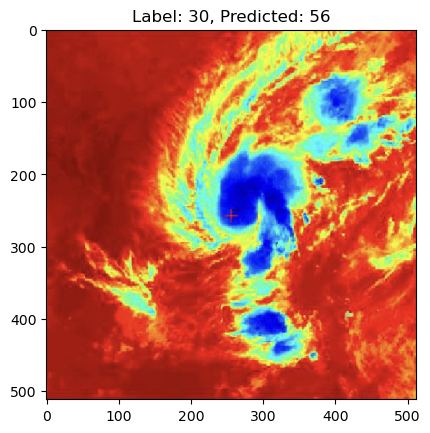

Label: 34, Predicted: 56


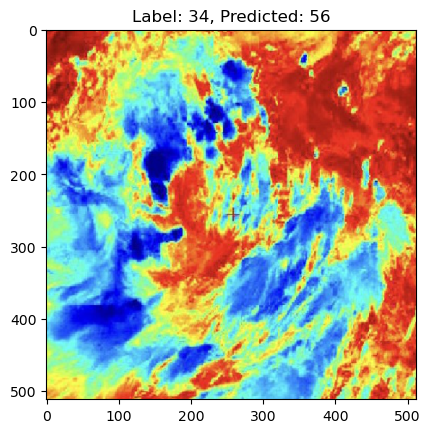

Label: 25, Predicted: 56


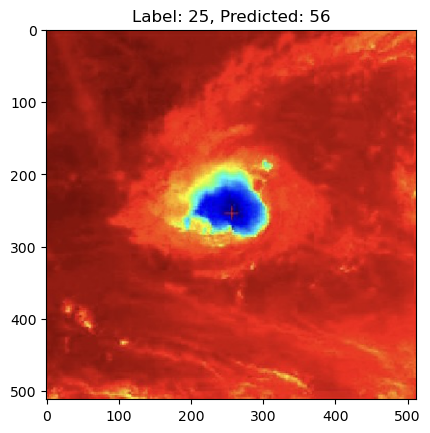

Label: 82, Predicted: 56


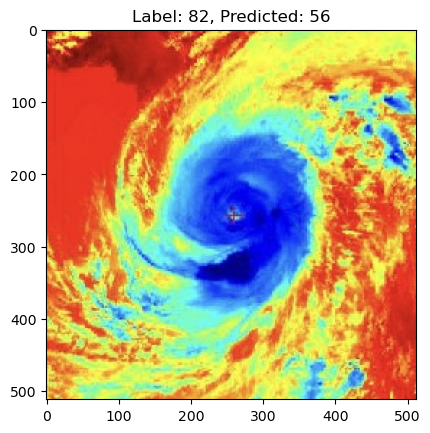

Label: 49, Predicted: 56


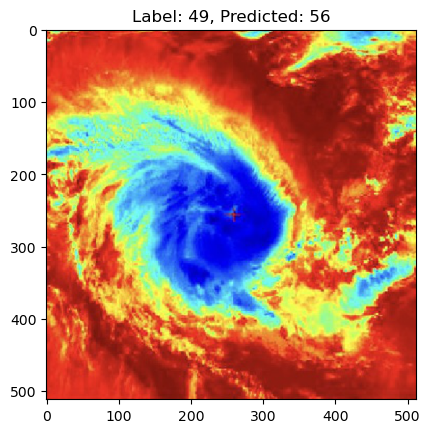

Label: 48, Predicted: 56


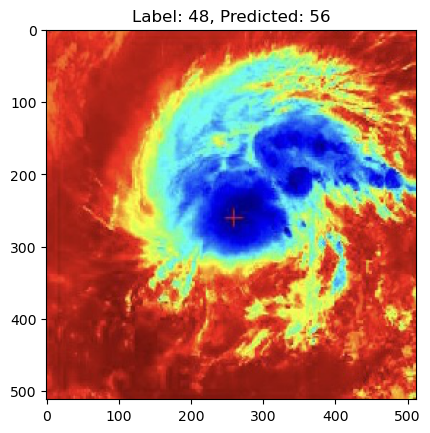

Label: 28, Predicted: 56


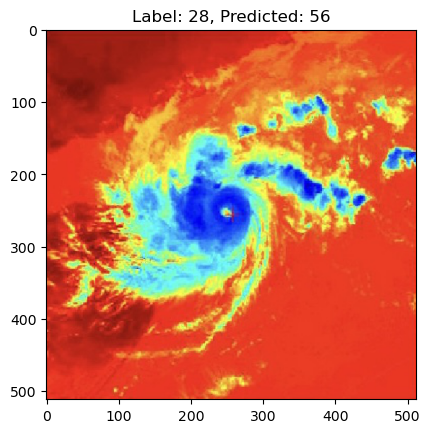

Label: 77, Predicted: 56


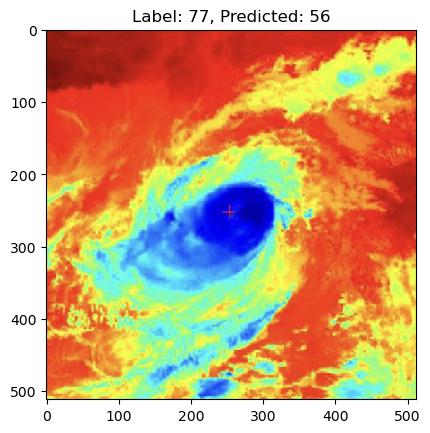

Batch 1:
Label: 81, Predicted: 56


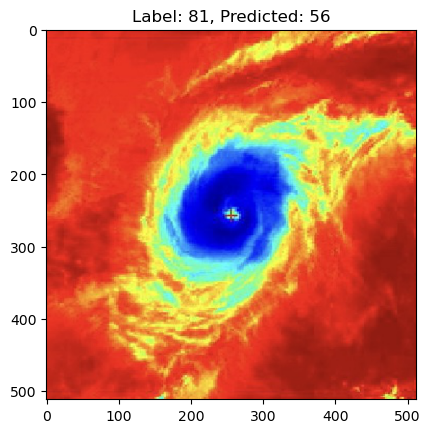

Label: 45, Predicted: 56


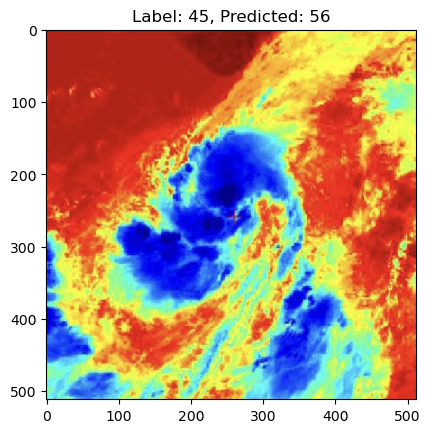

Label: 62, Predicted: 56


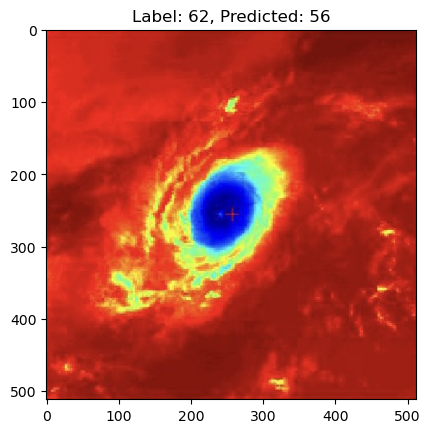

Label: 53, Predicted: 56


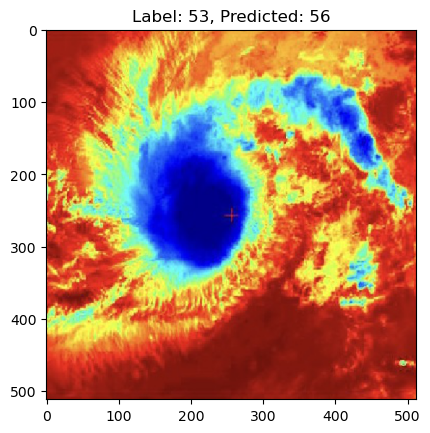

Label: 40, Predicted: 56


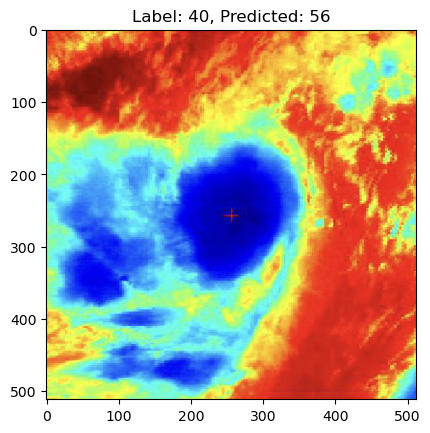

Label: 81, Predicted: 56


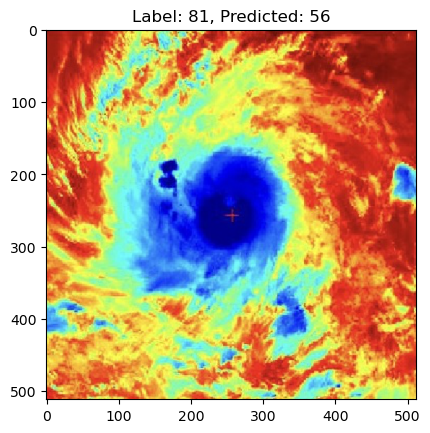

Label: 67, Predicted: 56


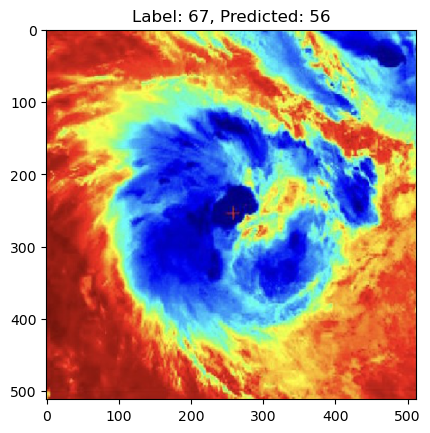

Label: 40, Predicted: 56


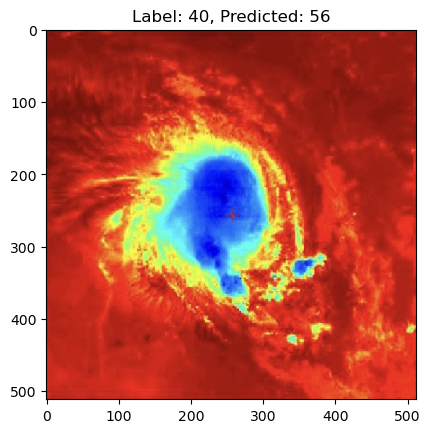

Batch 2:
Label: 41, Predicted: 56


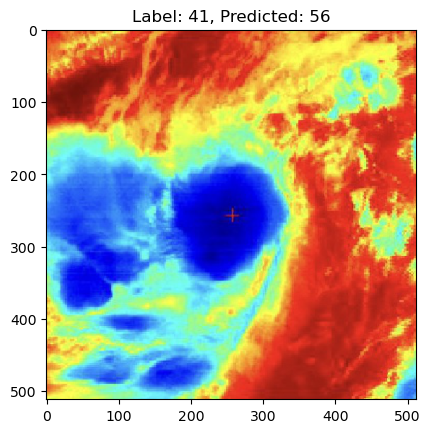

Label: 31, Predicted: 56


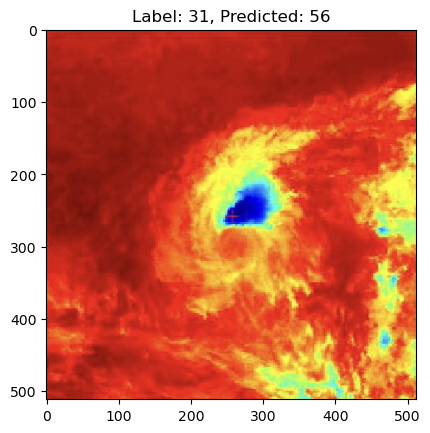

Label: 35, Predicted: 56


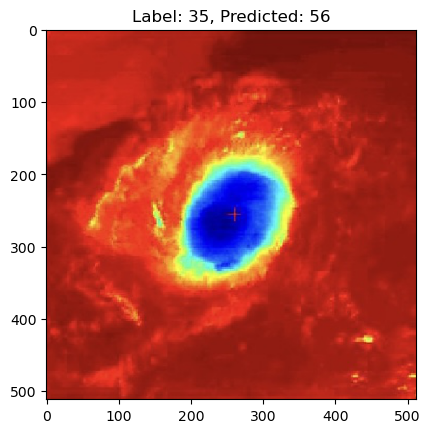

Label: 64, Predicted: 56


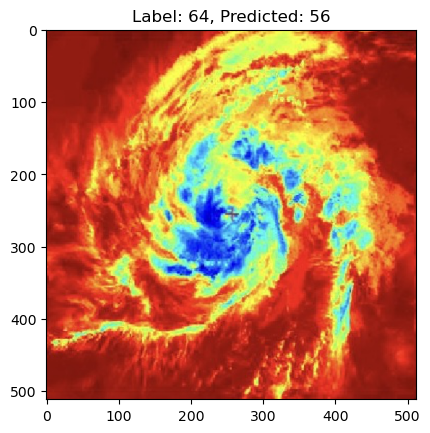

Label: 69, Predicted: 56


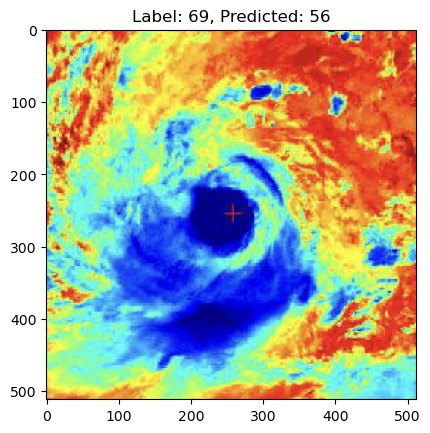

Label: 83, Predicted: 56


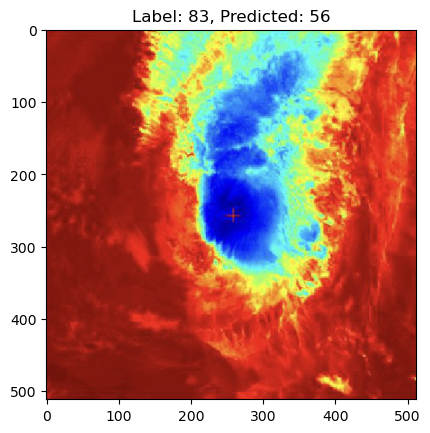

Label: 61, Predicted: 56


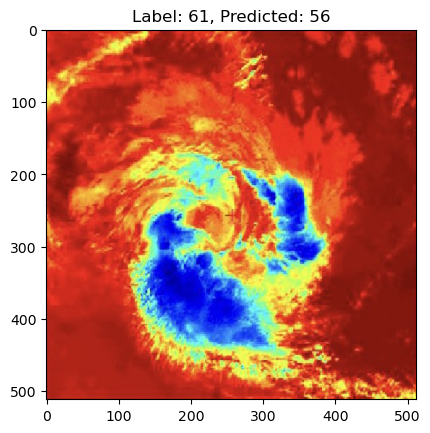

Label: 69, Predicted: 56


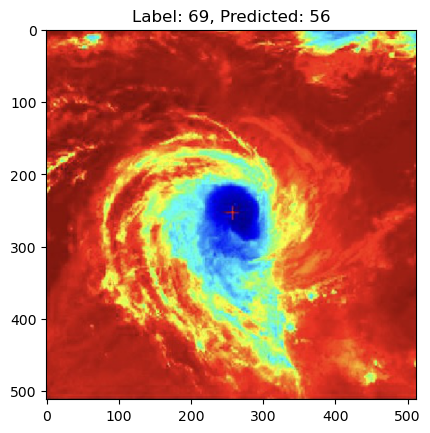

Batch 3:
Label: 74, Predicted: 56


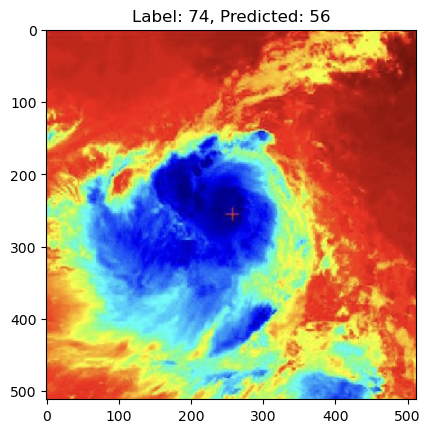

Label: 47, Predicted: 56


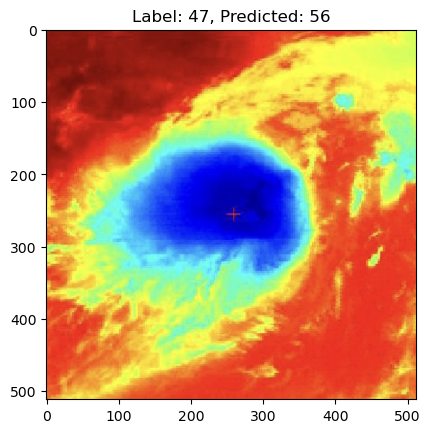

Label: 111, Predicted: 56


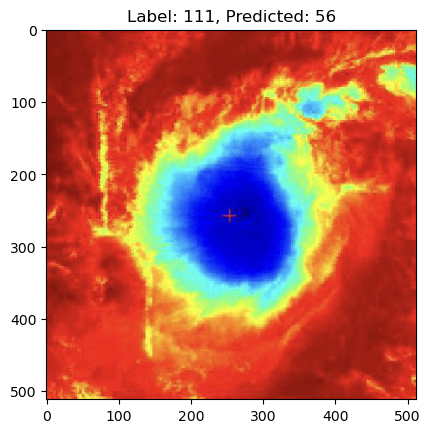

Label: 44, Predicted: 56


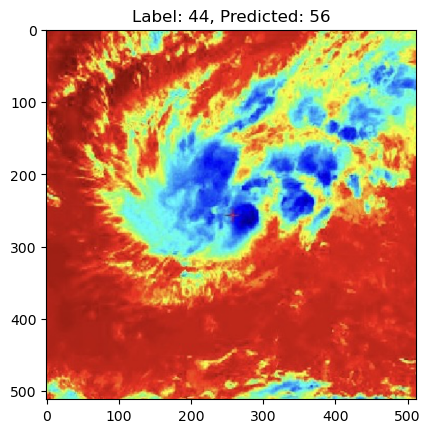

In [30]:
def test_model(model, test_loader):
    model.eval()  
    with torch.no_grad(): 
        for i, (images, labels) in enumerate(test_loader):
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            print(f"Batch {i}:")
            for j in range(images.size(0)):
                print(f"Label: {labels[j].item()}, Predicted: {predicted[j].item()}")
                plt.imshow(images[j].permute(1, 2, 0))  # Convert tensor to image format
                plt.title(f"Label: {labels[j].item()}, Predicted: {predicted[j].item()}")
                plt.show()

PATH = "/Users/adityajain/Downloads/model.pth"
model = SPP_NET(input_nc=3)
model.load_state_dict(torch.load(PATH, map_location = torch.device('cpu')))
test_model(model,test_loader)